In [1]:
from shapely.geometry import Point
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import folium
from folium.plugins import MarkerCluster
from folium.plugins import FastMarkerCluster

In [2]:
zipcodes = gpd.read_file('../data/zipcodes.geojson')
print(zipcodes.crs)
zipcodes.head( )

epsg:4326


,zip,objectid,po_name,shape_stlength,shape_starea,geometry
0,37115,1,MADISON,178783.02488886821,596553400.57885742,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ..."
1,37216,3,NASHVILLE,75820.997821400058,188884682.28344727,"MULTIPOLYGON (((-86.73451 36.23774, -86.73425 ..."
2,37204,9,NASHVILLE,93180.292250425613,200664795.51708984,"MULTIPOLYGON (((-86.77914 36.13424, -86.77923 ..."
3,37027,11,BRENTWOOD,159760.6942933173,174978422.04101562,"MULTIPOLYGON (((-86.81258 36.06319, -86.81263 ..."
4,37064,18,FRANKLIN,28995.828320601937,46969608.005737305,"MULTIPOLYGON (((-87.02197 36.01200, -87.02140 ..."


In [3]:
zipcodes.crs = "EPSG:4326"
print(zipcodes.crs)

EPSG:4326


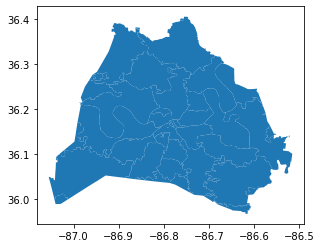

In [4]:
zipcodes.plot();

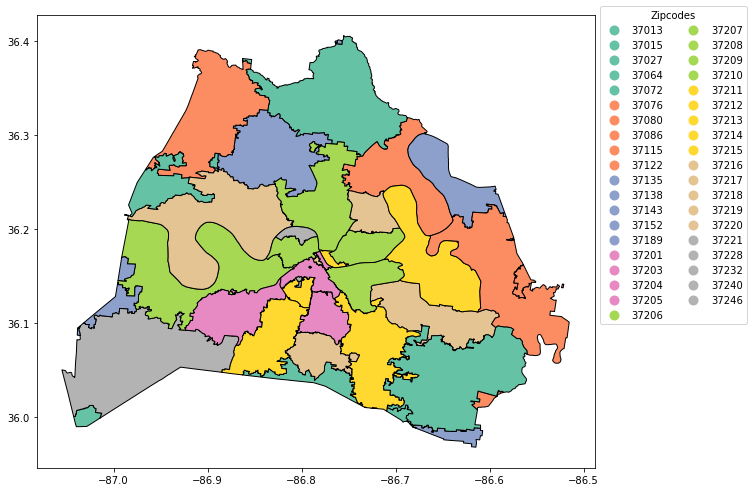

In [5]:
leg_kwds = {'title': 'Zipcodes', 'loc': 'upper left', 
            'bbox_to_anchor': (1, 1.03), 'ncol': 2}

zipcodes.plot(column = 'zip', figsize=(10, 10),
              edgecolor = 'black',
              legend = True, legend_kwds = leg_kwds, 
              cmap = 'Set2')
#plt.show()

In [6]:
subrequests = pd.read_csv('../data/cleanedup_subrequests.csv')
print(subrequests.shape)
subrequests.head(3)

(348671, 8)


/opt/anaconda3/envs/geo/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (4) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


,Subrequest Type,Address,City,Council District,ZIP,lat,lon,Geometry
0,COVID-19 - Submit Input about The Plan to Reop...,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Quick Requests,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,Quick Requests,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [7]:
hub_data = pd.read_csv('../data/hubNashville__311__Service_Requests.csv')
#hub_data.head()

/opt/anaconda3/envs/geo/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3063: DtypeWarning: Columns (17) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [8]:
#nulls = subrequests['lat'].isnull()
#nulls.value_counts()

In [9]:
#subrequests.tail(3)

In [10]:
#subrequests['Subrequest Type'].value_counts()
#subrequests = subrequests['Subrequest Type'].value_counts().reset_index(name="count").query("count > 10000")["index"]
 #df2.mi.value_counts().reset_index(name="count").query("count > 5")["index"]


In [11]:
trashy = hub_data[hub_data['Request Type'] == 'Trash, Recycling & Litter']
#trashy.head()

In [12]:
hub_data['Geometry'] = hub_data.apply(lambda x: Point((float(x.	Longitude), 
                                                         float(x.Latitude))), 
                                        axis=1)


In [13]:
hub_data_geo = gpd.GeoDataFrame(hub_data,  
                           geometry = hub_data['Geometry'])
#hub_data_geo

In [14]:

trashy['Geometry'] = trashy.apply(lambda x: Point((float(x.Longitude), 
                                                         float(x.Latitude))), 
                                        axis=1)

/opt/anaconda3/envs/geo/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


In [15]:
trashy_geo = gpd.GeoDataFrame(trashy,  
                           geometry = hub_data['Geometry'])
#trashy_geo.head(5)

In [16]:
trashy_geo = trashy_geo.dropna(subset=['Geometry', 'Longitude', 'Latitude'])
print(trashy_geo.shape)

(143785, 23)


In [17]:
#subrequests = gpd.GeoDataFrame(subrequests,  
#                           geometry = subrequests['Geometry'])
#subrequests

In [18]:
#subrequests.crs = "EPSG:4326"

In [19]:
#subrequests.crs

In [20]:
#zip_subrequests = gpd.GeoDataFrame(subrequests, 
#                           crs = zipcodes.crs, 
#                           geometry = subrequests['Geometry'])



In [21]:
zipcodes = zipcodes[['zip', 'po_name', 'geometry']]


In [22]:
trashy_by_zip = gpd.sjoin(zipcodes, trashy_geo, op = 'contains')
trashy_by_zip.head()

/opt/anaconda3/envs/geo/lib/python3.7/site-packages/geopandas/tools/sjoin.py:61: UserWarning: CRS of frames being joined does not match!(EPSG:4326 != None)
  "(%s != %s)" % (left_df.crs, right_df.crs)


,zip,po_name,geometry,index_right,Request #,Status,Request Type,Subrequest Type,Additional Subrequest Type,Date / Time Opened,...,Parent Request,Closed When Created,Address,City,Council District,ZIP,Latitude,Longitude,Mapped Location,Geometry
0,37115,MADISON,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ...",239880,123242,Closed,"Trash, Recycling & Litter",New Service/Activate Service,New Construction Residential Recycle,12/13/2018 04:13:00 PM,...,NaN,False,141 Eagan Cir,MADISON,9.0,37115,36.264633,-86.679889,"(36.2646333, -86.6798885)",POINT (-86.6798885 36.2646333)
0,37115,MADISON,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ...",214513,146700,Closed,"Trash, Recycling & Litter",Extra Cart Pickup Request,Extra Recycle Cart Pickup,02/25/2019 09:41:00 PM,...,NaN,False,141 Eagan Cir,MADISON,9.0,37115,36.264633,-86.679889,"(36.2646333, -86.6798885)",POINT (-86.6798885 36.2646333)
0,37115,MADISON,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ...",188153,177593,Closed,"Trash, Recycling & Litter",Extra Cart Pickup Request,Extra Recycle Cart Pickup,05/01/2019 06:38:00 PM,...,NaN,False,141 Eagan Cir,MADISON,9.0,37115,36.264633,-86.679889,"(36.2646333, -86.6798885)",POINT (-86.6798885 36.2646333)
0,37115,MADISON,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ...",253579,98127,Closed,"Trash, Recycling & Litter",New Service/Activate Service,Activate your Recycle Service Account,09/12/2018 02:53:00 PM,...,NaN,True,"126 Vandiver Dr, Nashville, TN 37115, United S...",MADISON,9.0,37115,36.264770,-86.678720,"(36.26477, -86.67872)",POINT (-86.67872 36.26477)
0,37115,MADISON,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ...",262907,103719,Closed,"Trash, Recycling & Litter",Unwanted Recycling or Trash,Unwanted Trash,09/27/2018 11:15:00 AM,...,NaN,True,"143 Eagan Cir, Nashville, TN 37115, United States",MADISON,9.0,37115,36.264860,-86.679930,"(36.26486, -86.67993)",POINT (-86.67993 36.26486)


In [23]:
trashy_by_zip['zip'].value_counts()

37013    14703
37211    13383
37209    13296
37206    12123
37207    10389
37205     8500
37208     8397
37115     7712
37216     7122
37215     7016
37214     6809
37217     5827
37212     4990
37204     4819
37218     4816
37210     4424
37203     3574
37027     1477
37220     1461
37221      692
37076      440
37219      437
37189      432
37201      241
37138      236
37072      137
37080       79
37228       60
37213       33
37135       14
37086        7
37015        6
37122        6
37143        4
37064        4
37246        1
37240        1
37232        1
Name: zip, dtype: int64

In [24]:
map_nash_trashy = folium.Map(location = [36.1227, -86.8269] , zoom_start = 10)
marker_cluster = MarkerCluster().add_to(map_nash_trashy)
folium.GeoJson(zipcodes).add_to(map_nash_trashy)

#iterate through trashy_geo to create locations and markers for each trash-related request

for row_index, row_values in trashy_by_zip.iterrows():
    loc = [row_values['Latitude'], row_values['Longitude']]
    pop = str(row_values['Request Type'])
    marker = folium.Marker(
        location = loc, 
        popup = pop) 
    
    marker.add_to(marker_cluster)
#map_nash_trashy.save('../maps/map_nash.html')

#display our map
#map_nash_trashy

In [25]:
map_nash_trashy = folium.Map(location = [36.1227, -86.8269] , zoom_start = 10, tiles='Stamen Terrain')
marker_cluster = MarkerCluster().add_to(map_nash_trashy)
folium.GeoJson(zipcodes).add_to(map_nash_trashy)

#create a list of locations and pass them to FastMarkerCluster()
locations = trashy_by_zip[['Latitude', 'Longitude']].values.tolist()
map_nash_trashy.add_child(
    FastMarkerCluster(locations)
)




#display our map
#map_nash_trashy

In [26]:
#subrequests_by_zip = gpd.sjoin(subrequests, zipcodes, op = 'within')

In [27]:
#subrequests_by_zip.head()

In [28]:
#subrequests_by_zip['zip'].value_counts()


In [29]:
#leg_kwds = {'title': "Subrequest Type", 'loc': 'upper left',
#         'bbox_to_anchor': (1, 1.03), 'ncol': 1}

#ax = zipcodes.plot(figsize = (10, 10), color = 'green')
#subrequests_by_zip.plot( ax = ax, column = 'Subrequest Type',
#                    legend = True, legend_kwds = leg_kwds) ;
#plt.show();


In [30]:
#ax = polygon37207.plot(figsize = (8, 10), color = 'lightgreen')
#stops_in_37207.plot( ax = ax, column = 'route');
#plt.show();

In [31]:
#polygon37207.geometry.centroid

In [32]:
#folium.Map(location =  area_center, zoom_start = 12)

In [33]:
trashy_by_zip = trashy_by_zip.groupby(['ZIP']).count()

In [34]:
trashy_by_zip.head()

,zip,po_name,geometry,index_right,Request #,Status,Request Type,Subrequest Type,Additional Subrequest Type,Date / Time Opened,...,State Issue,Parent Request,Closed When Created,Address,City,Council District,Latitude,Longitude,Mapped Location,Geometry
ZIP,,,,,,,,,,,,,,,,,,,,,
0.0,1,1,1,1,1,1,1,1,1,1,...,1,0,1,1,1,1,1,1,1,1
37013.0,11452,11452,11452,11452,11452,11452,11452,11452,10759,11452,...,11452,34,11452,11450,11452,11452,11452,11452,11452,11452
37015.0,8,8,8,8,8,8,8,8,2,8,...,8,0,8,8,8,8,8,8,8,8
37027.0,1195,1195,1195,1195,1195,1195,1195,1195,1114,1195,...,1195,5,1195,1195,1194,1194,1195,1195,1195,1195
37064.0,3,3,3,3,3,3,3,3,0,3,...,3,0,3,3,3,3,3,3,3,3


In [35]:
trashy_by_zip = trashy_by_zip.reset_index()

In [36]:
trashy_by_zip = trashy_by_zip[['ZIP', 'Request Type']]
trashy_by_zip.head()

,ZIP,Request Type
0,0,1
1,37013,11452
2,37015,8
3,37027,1195
4,37064,3


In [37]:
trashy_by_zip.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74 entries, 0 to 73
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   ZIP           74 non-null     object
 1   Request Type  74 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 1.3+ KB


In [47]:
trashy_by_zip = trashy_by_zip.dropna(subset=['ZIP'])

In [39]:
#trashy_by_zip = trashy_by_zip.dropna(subset=['Latitute'])

In [48]:
trashy_by_zip.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 74 entries, 0 to 73
Data columns (total 2 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   ZIP           74 non-null     object
 1   Request Type  74 non-null     int64 
dtypes: int64(1), object(1)
memory usage: 1.7+ KB


In [49]:
merge_by_zip = pd.merge(zipcodes, trashy_by_zip, left_on = 'zip', right_on = 'ZIP')
type(merge_by_zip)

geopandas.geodataframe.GeoDataFrame

In [50]:
zipcodes.head()


,zip,po_name,geometry
0,37115,MADISON,"MULTIPOLYGON (((-86.68725 36.31821, -86.68722 ..."
1,37216,NASHVILLE,"MULTIPOLYGON (((-86.73451 36.23774, -86.73425 ..."
2,37204,NASHVILLE,"MULTIPOLYGON (((-86.77914 36.13424, -86.77923 ..."
3,37027,BRENTWOOD,"MULTIPOLYGON (((-86.81258 36.06319, -86.81263 ..."
4,37064,FRANKLIN,"MULTIPOLYGON (((-87.02197 36.01200, -87.02140 ..."


In [51]:
zipcodes.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 57 entries, 0 to 56
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype   
---  ------    --------------  -----   
 0   zip       57 non-null     object  
 1   po_name   57 non-null     object  
 2   geometry  57 non-null     geometry
dtypes: geometry(1), object(2)
memory usage: 1.5+ KB


In [91]:
chloro_nash_trash = folium.Map(location=[36.1227, -86.8269] , zoom_start = 9.4, tiles='CartoDB positron')
 

chloropleth = folium.Choropleth(
    geo_data=merge_by_zip,#polygons
    name='Geometry',
    data=merge_by_zip,#used to color
    columns=['zip', 'Request Type'],
    key_on='feature.properties.zip',# the distinct column
    fill_color='OrRd',
    fill_opacity=0.7,
    line_opacity=0.8,
    legend_name='Trash, Recycling & Litter'
).add_to(chloro_nash_trash)

folium.LayerControl().add_to(chloro_nash_trash)

# Display Zipcode Label
chloropleth.geojson.add_child(
    folium.features.GeoJsonTooltip(['zip'], labels=False)
)

chloro_nash_trash


#save an interactive HTML map by calling .save()
chloro_nash_trash.save('../maps/chloropleth.html')
